# 🤗 Introduction & Installation

Welcome! In this notebook, we will explore the powerful capabilities of the [Hugging Face Transformers](https://huggingface.co/docs/transformers/index) library.
Hugging Face has democratized Natural Language Processing (NLP) by providing easy access to state-of-the-art pre-trained models.

**Why Transformers?**
Transformer models (like BERT, GPT, T5) have revolutionized NLP by understanding context better than previous architectures. This library allows us to use them with just a few lines of code.

The cell below installs the necessary libraries:
* `transformers`: The core library for using pre-trained models.
* `sentencepiece` & `sacremoses`: Tokenizers used by some models.
* `datasets`: A library to easily access and share datasets.

The core concept we'll use initially is the **`pipeline()`**, an easy-to-use abstraction that handles all steps of an NLP task:
1. **Preprocessing**: Tokenizing raw text.
2. **Model Inference**: Feeding tokens into a pre-trained model.
3. **Post-processing**: Converting logits back to human-readable labels/probabilities.


In [1]:
%pip install -Uq transformers
%pip install -Uq sentencepiece
%pip install -Uq sacremoses
%pip install -Uq datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 10.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 8.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 20.0 MB/s eta 0:00:00:00:0100:01


# HuggingFace and Transformers

## Transformer Applications

https://huggingface.co/docs/transformers/v4.35.0/en/quicktour#pipeline

- Text Classification
- Named Entity Recognition (NER)
- Question Answering
- Summarization
- Translation
- Text Generation
- Image Generation
- Audio Generation
- Video Generation
- Mixing of Audio and Video

## Text Classification
https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english

### 📝 Text Classification
**Task**: Assigning a label (e.g., positive/negative) to a given text.
**Default Model**: `distilbert-base-uncased-finetuned-sst-2-english`. This is a distilled (smaller, faster) version of BERT fine-tuned on the SST-2 sentiment analysis dataset.

**Code**:
We initialize `pipeline("sentiment-analysis")`. You can pass a single sentence or a list of sentences.
**Output**: A list of dictionaries containing `label` (POSITIVE/NEGATIVE) and `score` (confidence).


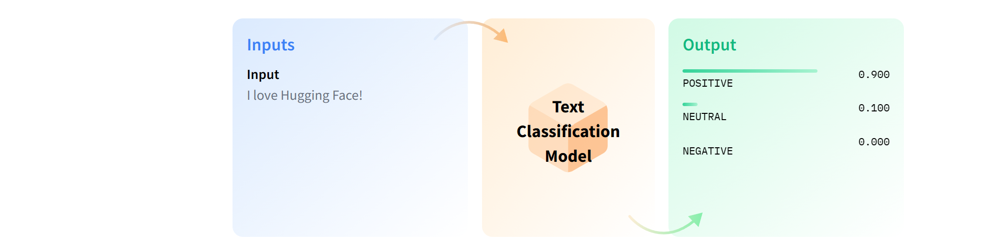

In [2]:
from transformers import pipeline
import pandas as pd


# hf_token = userdata.get('HF_TOKEN')
# login(hf_token, add_to_git_credential=True)

In [ ]:
classifier = pipeline("sentiment-analysis")
result = classifier("I'm super excited to be on the way to LLM mastery!")

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

## 🔧 Under the Hood: From Text to Numbers

The `pipeline()` function is magic, but what is it actually doing? It handles three main steps:
1. **Tokenization**: Converting raw text into numbers (Input IDs).
2. **Model Inference**: Passing these numbers through the model to get raw scores (Logits).
3. **Post-Processing**: Converting logits into human-readable probabilities and labels.

Let's see this in action using `AutoTokenizer` and `AutoModel`. This gives you full control and is how you'll work with models for custom tasks.


In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

# 1. Load Model & Tokenizer
model_name = "distilbert-base-uncased-finetuned-sst-2-english"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# 2. Tokenize Input
text = "The Hugging Face library makes NLP so easy!"
inputs = tokenizer(text, return_tensors="pt")
print(f"Token IDs:\n{inputs['input_ids'][0].tolist()}")

# 3. Model Inference
with torch.no_grad():
    logits = model(**inputs).logits
print(f"\nLogits:\n{logits}")

# 4. Post-Processing
predicted_class_id = logits.argmax().item()
predicted_label = model.config.id2label[predicted_class_id]
print(f"\nPredicted Label: {predicted_label}")


## 🕵️ Finding Models on the Hugging Face Hub

The `distilbert` model we used above is just one of thousands available.
You can find models for any task (Text, Image, Audio) on the [Hugging Face Hub](https://huggingface.co/models).

**Tips for searching:**
- Filter by **Task** (e.g., `Text Classification`, `Token Classification`).
- Filter by **Language** (e.g., `English`, `French`).
- Sort by **Downloads** or **Likes** to find popular, production-ready models.


In [ ]:
print(result)

[{'label': 'POSITIVE', 'score': 0.9993460774421692}]


In [ ]:
result = classifier(["I am starving", "The book was a great read", "I am not too impressed by the movie"])
result

[{'label': 'NEGATIVE', 'score': 0.9996936321258545},
 {'label': 'POSITIVE', 'score': 0.9998124241828918},
 {'label': 'NEGATIVE', 'score': 0.98661208152771}]

In [ ]:
model = "tabularisai/multilingual-sentiment-analysis"
classifier = pipeline("sentiment-analysis", model=model)
result = classifier(["I am starving", "The book was a great read", "I am not too impressed by the movie"])
result

config.json:   0%|          | 0.00/851 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/541M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Device set to use cuda:0


[{'label': 'Positive', 'score': 0.42158547043800354},
 {'label': 'Positive', 'score': 0.9133108854293823},
 {'label': 'Negative', 'score': 0.8855112195014954}]

In [ ]:
classifier = pipeline("text-classification", model = "SamLowe/roberta-base-go_emotions")

text = "wow! we have come across this far"

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

Device set to use cuda:0


In [ ]:
outputs = classifier(text)

outputs

[{'label': 'surprise', 'score': 0.6307517886161804}]

In [ ]:
classifier(["I am starving", "The book was a great read", "I am not too impressed by the movie"])

[{'label': 'sadness', 'score': 0.8072634339332581},
 {'label': 'admiration', 'score': 0.9513152837753296},
 {'label': 'disapproval', 'score': 0.6823031902313232}]

In [ ]:
pd.DataFrame(outputs)

,label,score
0,surprise,0.630752


In [ ]:
# Classification

classifier = pipeline("zero-shot-classification")
result = classifier("Hugging Face's Transformers library is amazing!", candidate_labels=["technology", "sports", "politics"])
print(result)

No model was supplied, defaulted to facebook/bart-large-mnli and revision d7645e1 (https://huggingface.co/facebook/bart-large-mnli).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Device set to use cuda:0


{'sequence': "Hugging Face's Transformers library is amazing!", 'labels': ['technology', 'sports', 'politics'], 'scores': [0.9493839740753174, 0.03225007280707359, 0.018365919589996338]}


## Named Entity Recognition

### 🏷️ Named Entity Recognition (NER)
**Task**: Identifying and classifying entities (like names, organizations, locations) in text.
**Default Model**: `dbmdz/bert-large-cased-finetuned-conll03-english`. A BERT model fine-tuned on the CoNLL-03 NER dataset.

**Code**:
We initialize `pipeline("ner", aggregation_strategy="simple")`.
* `aggregation_strategy="simple"` helps group sub-word tokens (like "New" "York") into a single entity ("New York") for cleaner output.
**Output**: A list of detected entities with their type (e.g., PER, ORG, LOC), scores, and character positions.
**Real-world Use Cases**: Extracting dates/locations from emails, Anonymizing sensitive data (PII), Content recommendation.


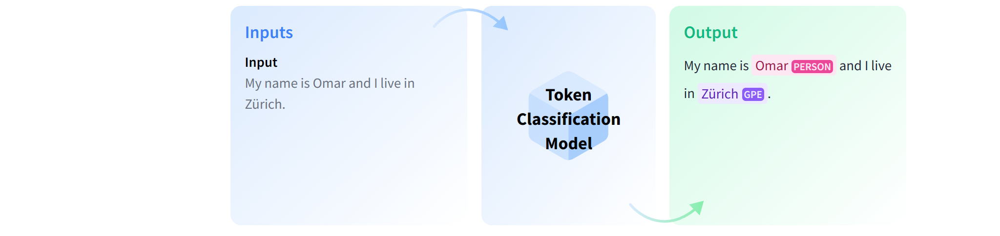

In [ ]:
# Named Entity Recognition

ner = pipeline("ner", grouped_entities=True)
result = ner("Barack Obama was the 44th president of the United States.")


No model was supplied, defaulted to dbmdz/bert-large-cased-finetuned-conll03-english and revision 4c53496 (https://huggingface.co/dbmdz/bert-large-cased-finetuned-conll03-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/998 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/60.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

Device set to use cuda:0
/usr/local/lib/python3.12/dist-packages/transformers/pipelines/token_classification.py:186: UserWarning: `grouped_entities` is deprecated and will be removed in version v5.0.0, defaulted to `aggregation_strategy="AggregationStrategy.SIMPLE"` instead.
  warnings.warn(


In [ ]:
result

[{'entity_group': 'PER',
  'score': np.float32(0.99918306),
  'word': 'Barack Obama',
  'start': 0,
  'end': 12},
 {'entity_group': 'LOC',
  'score': np.float32(0.9986908),
  'word': 'United States',
  'start': 43,
  'end': 56}]

In [ ]:
pd.DataFrame(result)

,entity_group,score,word,start,end
0,PER,0.999183,Barack Obama,0,12
1,LOC,0.998691,United States,43,56


## Question Answering

### 🔍 Extractive Question Answering
We can identify the span of text in a "context" that answers a specific "question".

*   **Task**: `question-answering`
*   **Model**: `distilbert-base-cased-distilled-squad` (DistilBERT fine-tuned on SQuAD)
*   **Input**: A question string and a context string.
*   **Output**: The answer string, its classification score, and its start/end positions in the context.

**Real-world Use Cases**: Automated FAQs, Document search assistants, extracting info from contracts.


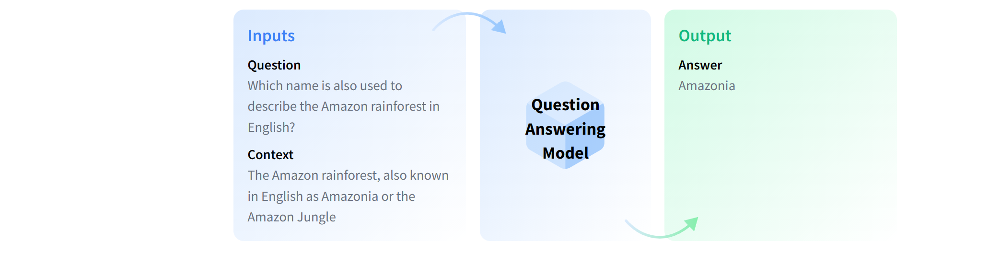

In [ ]:
text = """
Dear Amazon, last week I ordered an Optimus Prime action figure from your
online store in Los Angeles. Unfortunately when I opened the package, I discovered to
my horror that I had been sent an action figure of Megatron instead!
"""

reader = pipeline("question-answering")
question = "from where did I placed order?"

outputs = reader(question=question, context=text)
pd.DataFrame([outputs])

No model was supplied, defaulted to distilbert/distilbert-base-cased-distilled-squad and revision 564e9b5 (https://huggingface.co/distilbert/distilbert-base-cased-distilled-squad).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/473 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/261M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Fetching 0 files: 0it [00:00, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 0 files: 0it [00:00, ?it/s]

Device set to use cuda:0


,score,start,end,answer
0,0.421338,75,87,online store


In [ ]:
outputs

{'score': 0.4213382601737976, 'start': 75, 'end': 87, 'answer': 'online store'}

## Summarization

### 📝 Summarization
We can generate a shorter version of a text while retaining its most important information.

*   **Task**: `summarization`
*   **Model**: `sshleifer/distilbart-cnn-12-6` (Distilled BART fine-tuned on CNN/DailyMail)
*   **Input**: A long string of text.
*   **Output**: A summarized version of the text.

**Real-world Use Cases**: Generating meeting minutes, News digests, summarizing legal documents.


In [ ]:
text

'\nDear Amazon, last week I ordered an Optimus Prime action figure from your\nonline store in Los Angeles. Unfortunately when I opened the package, I discovered to\nmy horror that I had been sent an action figure of Megatron instead!\n'

In [ ]:
summarizer = pipeline("summarization")

outputs = summarizer(text)
outputs

No model was supplied, defaulted to sshleifer/distilbart-cnn-12-6 and revision a4f8f3e (https://huggingface.co/sshleifer/distilbart-cnn-12-6).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

Device set to use cuda:0
Your max_length is set to 142, but your input_length is only 52. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=26)


[{'summary_text': ' Amazon sent an Optimus Prime action figure from your online store in Los Angeles . Unfortunately when I opened the package, I discovered to my horror that I had been sent an action figure of Megatron instead! Amazon.com: "I was sent a figure of Optimus Prime instead!"'}]

In [ ]:
outputs[0]['summary_text']

' Amazon sent an Optimus Prime action figure from your online store in Los Angeles . Unfortunately when I opened the package, I discovered to my horror that I had been sent an action figure of Megatron instead! Amazon.com: "I was sent a figure of Optimus Prime instead!"'

In [ ]:
# Text Summarization

summarizer = pipeline("summarization")
text = """The Hugging Face transformers library is an incredibly versatile and powerful tool for natural language processing (NLP).
It allows users to perform a wide range of tasks such as text classification, named entity recognition, and question answering, among others.
It's an extremely popular library that's widely used by the open-source data science community.
It lowers the barrier to entry into the field by providing Data Scientists with a productive, convenient way to work with transformer models.
"""
summary = summarizer(text, max_length=50, min_length=25, do_sample=False)
print(summary[0]['summary_text'])

No model was supplied, defaulted to sshleifer/distilbart-cnn-12-6 and revision a4f8f3e (https://huggingface.co/sshleifer/distilbart-cnn-12-6).
Using a pipeline without specifying a model name and revision in production is not recommended.
Device set to use cuda:0


 The Hugging Face transformers library is an incredibly versatile and powerful tool for natural language processing . It allows users to perform a wide range of tasks such as text classification, named entity recognition, and question answering .


## Translation

### 🌐 Translation
We can translate text from one language to another using models trained on translation pairs.

*   **Task**: `translation_en_to_de` (English to German)
*   **Model**: `Helsinki-NLP/opus-mt-en-de` (MarianMT)
*   **Input**: Text in the source language (English).
*   **Output**: Translated text in the target language (German).

**Real-world Use Cases**: Localizing content, Multilingual support chat.


In [ ]:
translator = pipeline("translation_en_to_de", model="Helsinki-NLP/opus-mt-en-de")

outputs = translator(text)
outputs

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/298M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/298M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/768k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/797k [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

Device set to use cuda:0


[{'translation_text': 'Die Hugging Face Trafos Library ist ein unglaublich vielseitiges und leistungsstarkes Tool für die natürliche Sprachverarbeitung (NLP). Sie ermöglicht es Benutzern, eine breite Palette von Aufgaben wie Textklassifizierung, benannte Entity-Erkennung und Fragen beantworten, unter anderem. Es ist eine äußerst beliebte Bibliothek, die weit verbreitet von der Open-Source-Data-Science-Community verwendet wird. Es senkt die Barriere für den Eintritt in das Feld durch die Bereitstellung von Data Scientists mit einer produktiven, bequemen Art und Weise, mit Transformatorenmodellen zu arbeiten.'}]

In [ ]:
translator = pipeline(model="Helsinki-NLP/opus-mt-en-ar")

outputs = translator(text)
outputs

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/308M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/308M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/801k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/917k [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

Device set to use cuda:0


[{'translation_text': 'مكتبة محولات واجهة التهجين هي أداة متنوعة وقوية بشكل لا يصدق لمعالجة اللغات الطبيعية (NLP). وهي تسمح للمستخدمين بأداء مجموعة واسعة من المهام مثل تصنيف النصوص، والتعرف على الكيان المسمّى، والإجابة على الأسئلة، من بين أمور أخرى. إنها مكتبة شعبية للغاية تستخدم على نطاق واسع من قبل مجتمع علم البيانات المفتوحة المصدر. إنها تخفض الحاجز أمام الدخول إلى الميدان من خلال تزويد علماء البيانات بطريقة منتجة وملائمة للعمل مع نماذج المحولات.'}]

## Text Generation

### 📝 Text Generation
Generative models can automatically complete a sentence or paragraph based on a given prompt.

*   **Task**: `text-generation`
*   **Model**: `gpt2` (Generative Pre-trained Transformer 2)
*   **Input**: A text prompt string.
*   **Output**: A continuation of the text generated by the model.


In [ ]:
# Text Generation

generator = pipeline("text-generation")
result = generator("If there's one thing I want you to remember about using HuggingFace pipelines, it's")
print(result[0]['generated_text'])

No model was supplied, defaulted to openai-community/gpt2 and revision 607a30d (https://huggingface.co/openai-community/gpt2).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Device set to use cuda:0
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


If there's one thing I want you to remember about using HuggingFace pipelines, it's that it's completely automated. If the pipeline is run in a specific order, it will automatically give you the best results.

If I'm trying to use a custom project, I have to manually create the template, and manually run the pipeline.

The easiest way to do this would be to run the pipeline at run time. This would not only make sure you are using the correct language (and can get the results pretty quickly), but it also makes it easy to know how to work with the pipeline.

The next thing I want to do is create a set of rules for the pipeline. This is the easiest way to do it.

First, I want to create the rules for the pipeline and set the name of the pipeline. The name of the pipeline should be something like:

{ "name": "My-My-Project", "title": "My-My-Project", "description": "My-My-Project", "url": "https://github.com/myproject/My-My-Project" }

Note that you can use any of the following:

{ "name":

## Image Classification

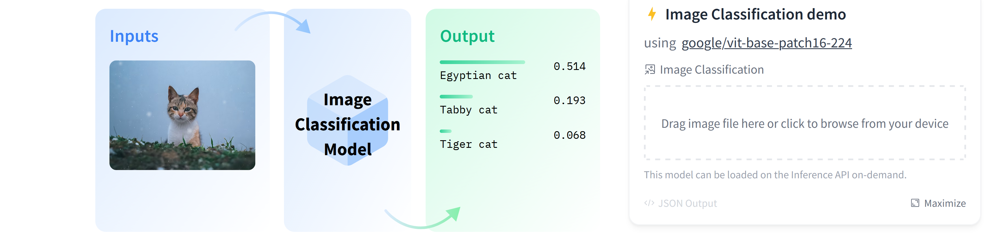

In [ ]:
from PIL import Image
import requests
from transformers import pipeline


In [ ]:
url = "https://res.cloudinary.com/dk-find-out/image/upload/q_80,w_1920,f_auto/DCTM_Penguin_UK_DK_AL697473_RGB_PNG_namnse.jpg"

image = Image.open(requests.get(url, stream=True).raw)

In [ ]:
# image

In [ ]:
classifier = pipeline("image-classification")

No model was supplied, defaulted to google/vit-base-patch16-224 and revision 3f49326 (https://huggingface.co/google/vit-base-patch16-224).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Device set to use cuda:0


In [ ]:
outputs = classifier(image)
outputs

[{'label': 'Egyptian cat', 'score': 0.9214929342269897},
 {'label': 'tabby, tabby cat', 'score': 0.05818362161517143},
 {'label': 'tiger cat', 'score': 0.012602932751178741},
 {'label': 'lynx, catamount', 'score': 0.0037158855702728033},
 {'label': 'Siamese cat, Siamese', 'score': 0.00039998115971684456}]

In [ ]:
url = "https://img.freepik.com/free-photo/young-bearded-man-with-striped-shirt_273609-5677.jpg"

image = Image.open(requests.get(url, stream=True).raw)
classifier = pipeline("image-classification", model="nateraw/vit-age-classifier")

outputs = classifier(image)
outputs



config.json:   0%|          | 0.00/850 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/197 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Device set to use cuda:0


[{'label': '30-39', 'score': 0.5545734167098999},
 {'label': '20-29', 'score': 0.39218607544898987},
 {'label': '40-49', 'score': 0.05055493488907814},
 {'label': '10-19', 'score': 0.0014976899838075042},
 {'label': '50-59', 'score': 0.0009426272008568048}]

## Image Segmentation

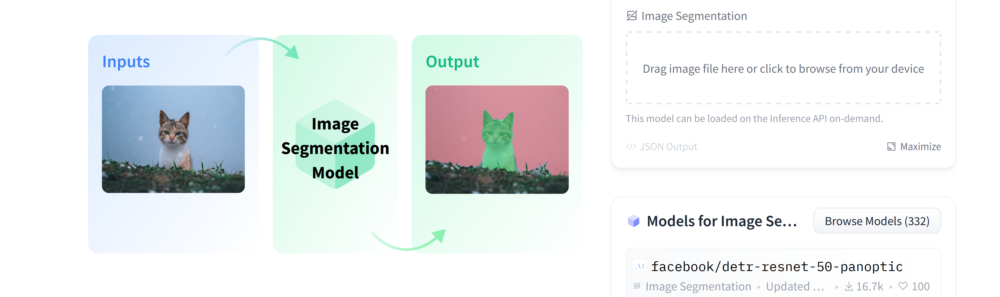

In [ ]:
url = "https://img.freepik.com/free-photo/young-bearded-man-with-striped-shirt_273609-5677.jpg"

image = Image.open(requests.get(url, stream=True).raw)

In [ ]:
segmenter = pipeline("image-segmentation", model="mattmdjaga/segformer_b2_clothes")
outputs = segmenter(image)

outputs

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/109M [00:00<?, ?B/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.12/dist-packages/transformers/image_processing_base.py:410: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'reduce_labels'
  image_processor = cls(**image_processor_dict)
Device set to use cuda:0


[{'score': None,
  'label': 'Background',
  'mask': <PIL.Image.Image image mode=L size=626x417>},
 {'score': None,
  'label': 'Hair',
  'mask': <PIL.Image.Image image mode=L size=626x417>},
 {'score': None,
  'label': 'Upper-clothes',
  'mask': <PIL.Image.Image image mode=L size=626x417>},
 {'score': None,
  'label': 'Face',
  'mask': <PIL.Image.Image image mode=L size=626x417>}]

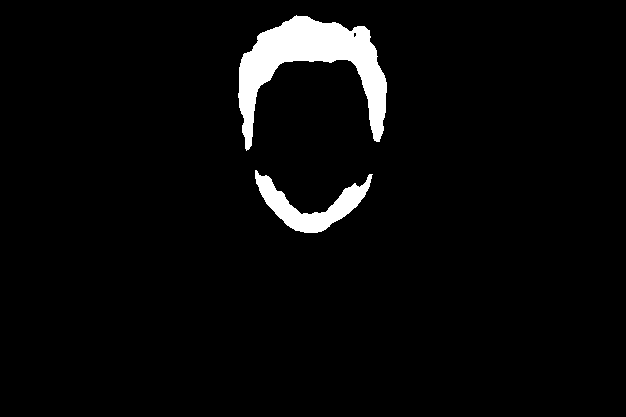

In [ ]:
outputs[1]['mask']

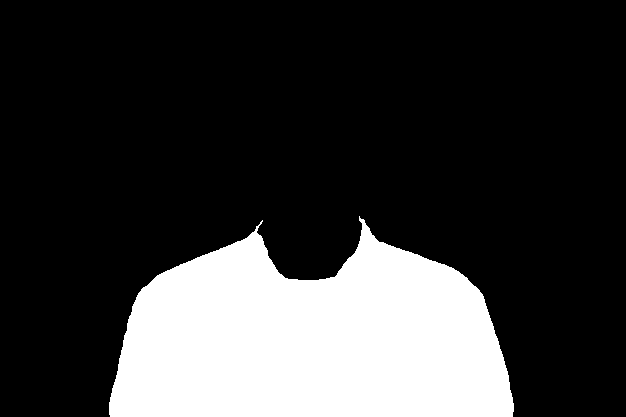

In [ ]:
outputs[2]['mask']

## Text to Speech

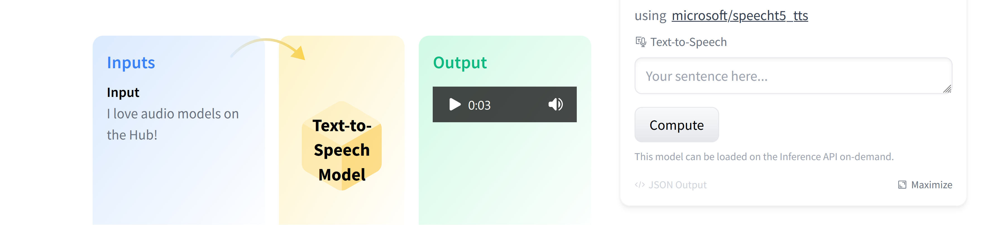

In [ ]:
import transformers
transformers.__version__

'4.56.1'

In [ ]:
# Audio Generation
from datasets import load_dataset
import soundfile as sf
from IPython.display import Audio
import torch

In [ ]:
text="""Sam Altman on Wednesday returned to OpenAI as the chief executive officer (CEO) and sacked the Board that had fired him last week. However, the only remaining member in the Board team is Adam D'Angelo, CEO of Quora.
Ex-Salesforce co-CEO Bret Taylor and former US Treasury Secretary and president of Harvard University, Larry Summers will join D'Angelo."""

In [ ]:
synth = pipeline("text-to-speech")

No model was supplied, defaulted to suno/bark-small and revision 1dbd7a1 (https://huggingface.co/suno/bark-small).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.68G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.68G [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/353 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Device set to use cuda:0


In [ ]:
speech=synth(text)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


In [ ]:
speech

{'audio': array([[0.02329359, 0.02836911, 0.03651281, ..., 0.05196029, 0.05791395,
         0.0502866 ]], dtype=float32),
 'sampling_rate': 24000}

In [ ]:
sf.write("speech2.wav", speech["audio"].T, samplerate=speech['sampling_rate'])
Audio("speech2.wav")

## Text to Music Generation

In [ ]:
synth = pipeline("text-to-audio", "facebook/musicgen-small")
text = "a chill song with influences from lofi, chillstep and downtempo"

music = synth(text, forward_params={"do_sample":True})


config.json:   0%|          | 0.00/7.87k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.36G [00:00<?, ?B/s]

Config of the text_encoder: <class 'transformers.models.t5.modeling_t5.T5EncoderModel'> is overwritten by shared text_encoder config: T5Config {
  "_name_or_path": "t5-base",
  "architectures": [
    "T5ForConditionalGeneration"
  ],
  "classifier_dropout": 0.0,
  "d_ff": 3072,
  "d_kv": 64,
  "d_model": 768,
  "decoder_start_token_id": 0,
  "dense_act_fn": "relu",
  "dropout_rate": 0.1,
  "eos_token_id": 1,
  "feed_forward_proj": "relu",
  "initializer_factor": 1.0,
  "is_encoder_decoder": true,
  "is_gated_act": false,
  "layer_norm_epsilon": 1e-06,
  "model_type": "t5",
  "n_positions": 512,
  "num_decoder_layers": 12,
  "num_heads": 12,
  "num_layers": 12,
  "output_past": true,
  "pad_token_id": 0,
  "relative_attention_max_distance": 128,
  "relative_attention_num_buckets": 32,
  "task_specific_params": {
    "summarization": {
      "early_stopping": true,
      "length_penalty": 2.0,
      "max_length": 200,
      "min_length": 30,
      "no_repeat_ngram_size": 3,
      "num_be

generation_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.37k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

Device set to use cuda:0
`torch.nn.functional.scaled_dot_product_attention` does not support having an empty attention mask. Falling back to the manual attention implementation. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.Note that this probably happens because `guidance_scale>1` or because you used `get_unconditional_inputs`. See https://github.com/huggingface/transformers/issues/31189 for more information.


In [ ]:
#sf.write("music.wav",music["audio"].T, samplerate=music['sampling_rate'])
import scipy
scipy.io.wavfile.write("music.wav", rate=music["sampling_rate"], data=music['audio'])

In [ ]:
Audio("music.wav")